In [1]:
# Import packages 
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
import os
import pandas as pd
import glasbey
import spatialdata_io as sp

# Log
sc.logging.print_header()

# Specify whether we want to check loading
check_load = False

scanpy==1.10.3 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.3 igraph==0.11.6 pynndescent==0.5.13


In [2]:
# Define input files 
sample_dir = '/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/data/AtoMx_Aug23/formatted/tma2/'
meta_file = [item for item in os.listdir(sample_dir) if 'metadata_file' in item][0]
counts_file = [item for item in os.listdir(sample_dir) if 'exprMat_file' in item][0]
fov_file = [item for item in os.listdir(sample_dir) if 'fov_positions_file' in item][0]

if check_load == True:
    print(meta_file)
    print(counts_file)
    print(fov_file)

In [3]:
# Load the fov file and check
fov_df = pd.read_csv(os.path.join(sample_dir, fov_file))

if check_load == True:
    print(fov_df)

In [4]:
# Reformat the FOV column - colname should be lowercase
if 'FOV' in fov_df.columns:
  print("Refactoring file to older format.")
  # Rename 'FOV' column to 'fov'
  fov_df.rename(columns={'FOV': 'fov'}, inplace=True)
  # have fov_file reference the new, formatted file and write it
  fov_file = os.path.join(sample_dir,'fov_positions_formatted.csv')
  fov_df.to_csv(fov_file, index=False)

if check_load == True:
    print(fov_df)

Refactoring file to older format.


In [5]:
# Trial the spatialdata_io way of loading data - FAILS - GitHub issue raised. Local patch created see issue: https://github.com/scverse/spatialdata-io/issues/213
#adata01 = sp.cosmx(sample_dir, dataset_id = 'GCIN10692_TMA2')
# THis answers the question as to why FOVs are skipped in the squidpy loading - empty FOVs

In [6]:
# Load data - why are some FOVs skipped? - Empty 
adata1 = sq.read.nanostring(
    path=sample_dir,
    counts_file=counts_file,
    meta_file=meta_file,
    fov_file=fov_file
)

if check_load == True:
    print(adata1)

In [7]:
# Place control targets into separate variables
adata1.var["Negative"] = adata1.var_names.str.startswith("Negative")
adata1.var["SystemControl"] = adata1.var_names.str.startswith("SystemControl")

if check_load == True:
    print(adata1)

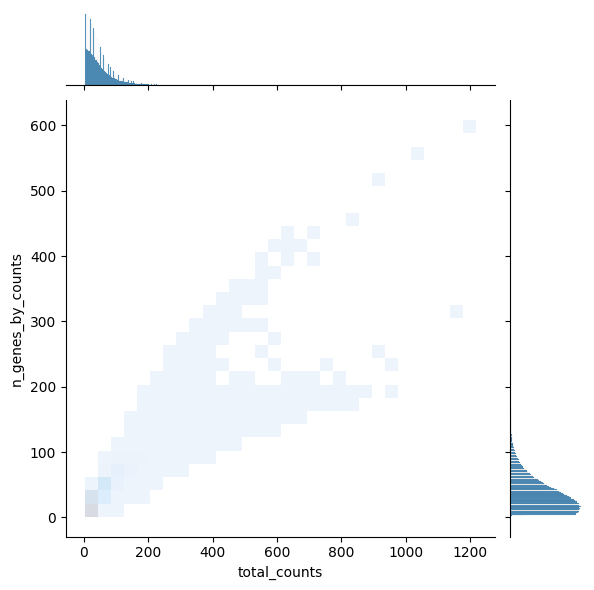

In [8]:
# QC plots
sc.pp.calculate_qc_metrics(adata1, qc_vars=["Negative", "SystemControl"], inplace=True)

# Unique genes per cell vs total counts per cell
sns.jointplot(
    data=adata1.obs,
    x="total_counts",
    y="n_genes_by_counts",
    kind="hist",
    alpha=0.2,
    bins=30
)
#plt.savefig("figures/fig-qc.png", dpi=200)

# Are we low on counts??? - Nanostring examples scale is up to 8000

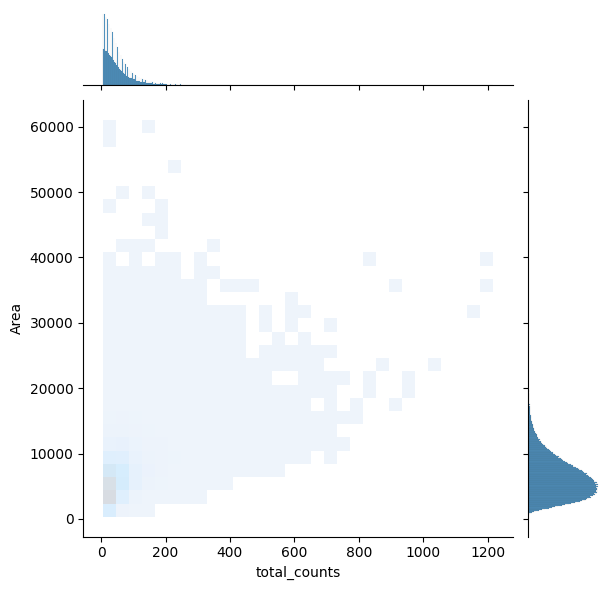

In [9]:
# Plot cell size against total counts
sns.jointplot(
    data=adata1.obs,
    x="total_counts",
    y="Area",
    kind="hist",
    alpha=0.2,
    bins=30
)

# Some very large cells - should these be removed??

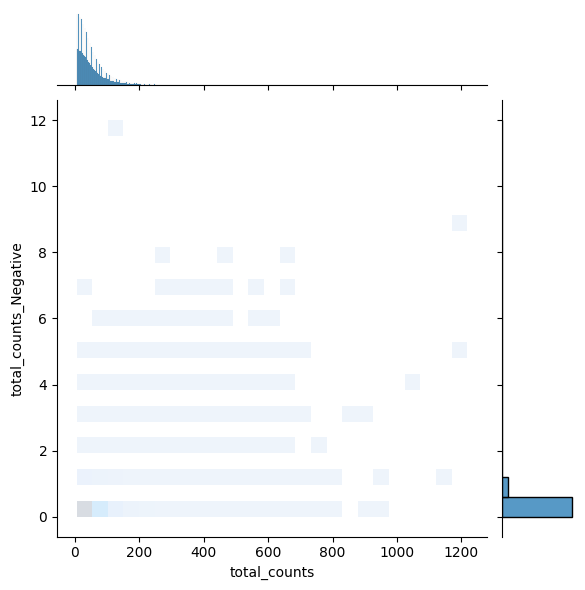

In [10]:
# Total negative probe counts per cell vs total counts per cell
sns.jointplot(
    data=adata1.obs,
    x="total_counts",
    y="total_counts_Negative",
    kind="hist",
    alpha=0.2,
    bins=25
)

#plt.savefig("figures/fig-qc1.png", dpi=200)

# This looks good, but as above - are total counts low??

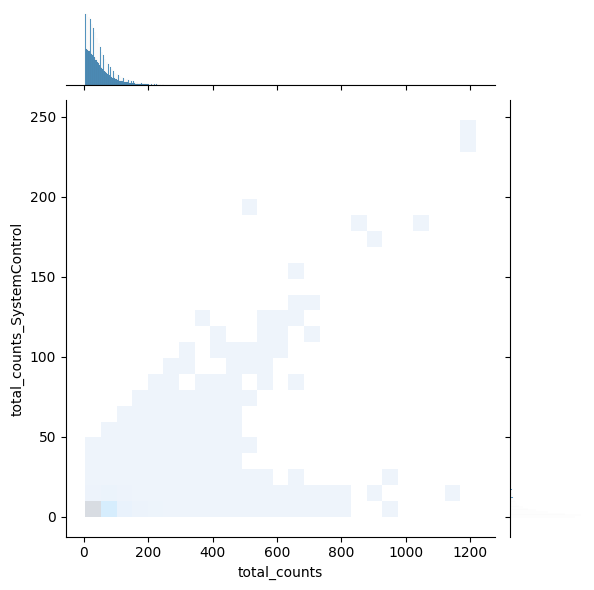

In [11]:
# Total system control counts per cell vs total counts per cell
sns.jointplot(
    data=adata1.obs,
    x="total_counts",
    y="total_counts_SystemControl",
    kind="hist",
    alpha=0.2,
    bins=25
)

#plt.savefig("figures/fig-qc1.png", dpi=200)

# Is this good??? Waiting for Nanostring feedback

In [12]:
# Proportion of negative counts 
percent_negs = adata1.obs["total_counts_Negative"].sum() / adata1.obs["total_counts"].sum() * 100
print('Percentage negative counts:', round(percent_negs, 2), '%')

# Proportion of system control counts 
percent_syscont = adata1.obs["total_counts_SystemControl"].sum() / adata1.obs["total_counts"].sum() * 100
print('Percentage system control counts:', round(percent_syscont, 2), '%')

# Mean counts per cell
mean_counts = adata1.obs["total_counts"].mean()
print('Mean counts per cell:', round(mean_counts, 2))

# Median counts per cell
mean_counts = adata1.obs["total_counts"].median()
print('Median counts per cell:', round(mean_counts, 2))

# We're good on the percentage negative counts.
# Not sure about system control counts... awaiting feedback

Percentage negative counts: 0.21 %
Percentage system control counts: 6.81 %
Mean counts per cell: 54.24
Median counts per cell: 39.0


In [13]:
def qcPlots(adata):
    # More QC plots 
    fig, axs = plt.subplots(2, 4, figsize=(20, 5))
    
    axs[0,0].set_title("Total transcripts per cell")
    sns.histplot(
        adata.obs["total_counts"],
        kde=False,
        ax=axs[0,0],
    )
    
    axs[0,1].set_title("Unique transcripts per cell")
    sns.histplot(
        adata.obs["n_genes_by_counts"],
        kde=False,
        ax=axs[0,1],
    )
    
    axs[0,2].set_title("Transcripts per FOV")
    sns.histplot(
        adata.obs.groupby("fov", observed = True).sum()["total_counts"],
        kde=False,
        ax=axs[0,2],
    )
    
    axs[0,3].set_title("Cell Area")
    sns.histplot(
        adata.obs["Area"],
        kde=False,
        ax=axs[0,3],
    )
    
    axs[1,0].set_title("Membrane Stain")
    sns.histplot(
        adata.obs["Mean.Membrane"],
        kde=False,
        ax=axs[1,0],
    )
    
    axs[1,1].set_title("PanCK")
    sns.histplot(
        adata.obs["Mean.PanCK"],
        kde=False,
        ax=axs[1,1],
    )
    
    axs[1,2].set_title("CD45")
    sns.histplot(
        adata.obs["Mean.CD45"],
        kde=False,
        ax=axs[1,2],
    )
    
    axs[1,3].set_title("CD68")
    sns.histplot(
        adata.obs["Mean.CD68"],
        kde=False,
        ax=axs[1,3],
    )
    
    fig.tight_layout()


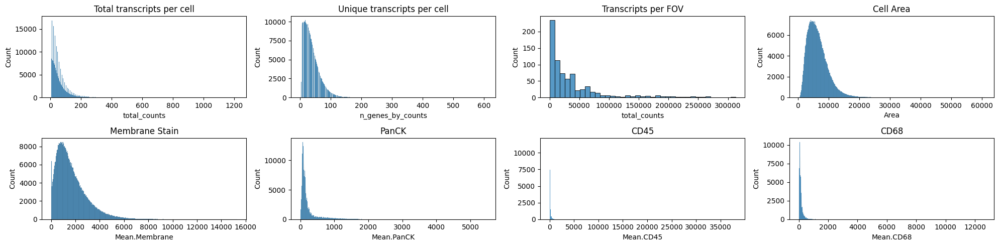

In [14]:
qcPlots(adata=adata1)

In [15]:
# View AnnData object dimensions before filtering 
adata1.shape

(521946, 1165)

<Axes: xlabel='cells_per_fov', ylabel='Count'>

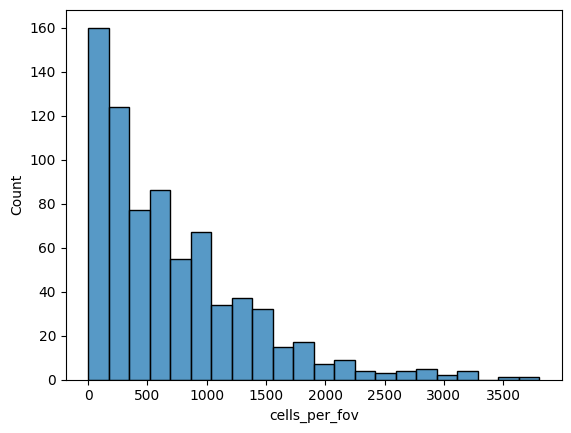

In [23]:
# Count number of cells per FOV
fovCellCountsUnfilt = pd.Series(adata1.obs['fov'].value_counts(), name = 'cells_per_fov')
sns.histplot(
    fovCellCountsUnfilt,
    kde=False,
)

In [16]:
# Filter cells
# Squidpy suggested = 100
# Nanostring suggested = 250

mask, _ = sc.pp.filter_cells(adata1, min_counts=100, inplace=False)
adata2 = adata1[mask].copy()

# View AnnData object dimensions after filtering 
adata2.shape

(70714, 1165)

In [17]:
# Filter genes
# Squidpy suggested = 400
# Nanostring suggested = 1000

sc.pp.filter_genes(adata2, min_cells=400)

# View AnnData object dimensions after filtering 
adata2.shape

(70714, 1124)

<Axes: xlabel='cells_per_fov', ylabel='Count'>

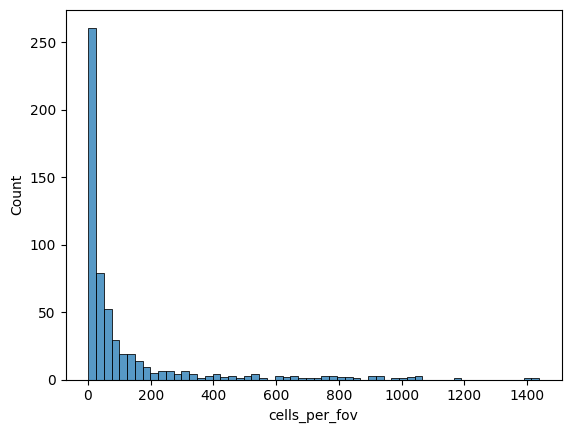

In [22]:
# Count number of cells per FOV
fovCellCounts = pd.Series(adata2.obs['fov'].value_counts(), name = 'cells_per_fov')
sns.histplot(
    fovCellCounts,
    kde=False,
)

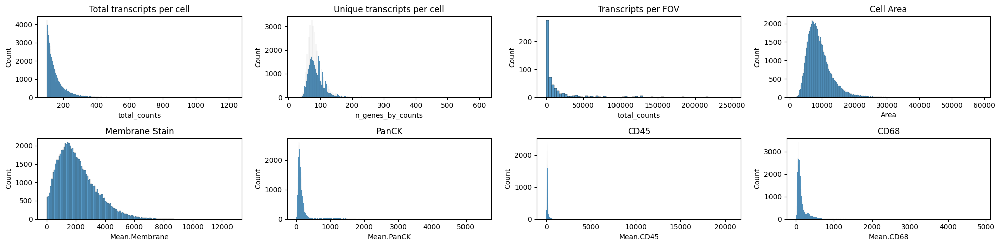

In [27]:
qcPlots(adata=adata2)

# Should we remove FOVs with low transcripts? - Focus on high quality FOVs - more accurate cell typing etc, reduce noise etc. - tried at the bottom

In [44]:
# Remove the system controls before data processing - these are not physical probes 
# Keep negative probes - actual non-target probes 
# These probes should be kept in for the normalisation? Because each cells gene expression should be scaled to background noise

# Remove system controls
adata3 = adata2[list(adata2.obs_names), list(~adata2.var_names.str.startswith(("SystemControl")))]

# Normalise
adata3.layers["counts"] = adata3.X.copy()
sc.pp.normalize_total(adata3, inplace=True, exclude_highly_expressed=True)

/tmp/slurm_10056877/ipykernel_4038511/3923405185.py:9: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata3.layers["counts"] = adata3.X.copy()


In [45]:
# Set cluster resolution for later
clustRes = 2

# Run data processing
sc.pp.log1p(adata3)
sc.pp.pca(adata3)
sc.pp.neighbors(adata3)
sc.tl.umap(adata3)
sc.tl.leiden(adata3, flavor="igraph", n_iterations=2, directed=False, resolution=clustRes)

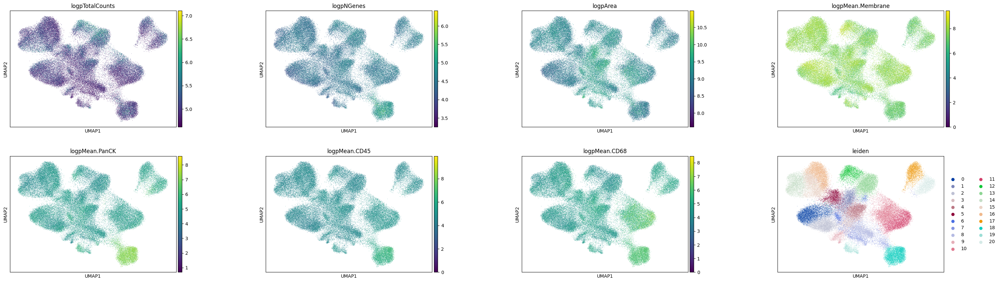

In [46]:
adata3.obs["logpTotalCounts"] = np.log1p(adata3.obs['total_counts'])
adata3.obs["logpNGenes"] = np.log1p(adata3.obs['n_genes_by_counts'])
adata3.obs["logpArea"] = np.log1p(adata3.obs['Area'])
adata3.obs["logpMean.Membrane"] = np.log1p(adata3.obs['Mean.Membrane'])
adata3.obs["logpMean.PanCK"] = np.log1p(adata3.obs['Mean.PanCK'])
adata3.obs["logpMean.CD45"] = np.log1p(adata3.obs['Mean.CD45'])
adata3.obs["logpMean.CD68"] = np.log1p(adata3.obs['Mean.CD68'])

sc.pl.umap(
    adata3,
    color=[
        "logpTotalCounts",
        "logpNGenes",
        "logpArea",
        "logpMean.Membrane",
        "logpMean.PanCK",
        "logpMean.CD45",
        "logpMean.CD68",
        "leiden"
    ],
    wspace=0.4,
)

In [47]:
# Custom colour pallette

# Retrieve number of clusters
nClust = max([int(i) for i in adata3.obs['leiden'].unique()])
#print(nClust)

# Make a list of cluster IDs
clusters = list(range(nClust+1))
clusters = map(str, clusters)
#print(clusters)

# Create a categorical palette with 11 colours
custPal = glasbey.create_palette(palette_size=(nClust+1))
#print(custPal)

# Make a tuple of the two lists above to convert into dict
custPalDict = dict(zip(clusters, custPal))
#print(custPalDict)

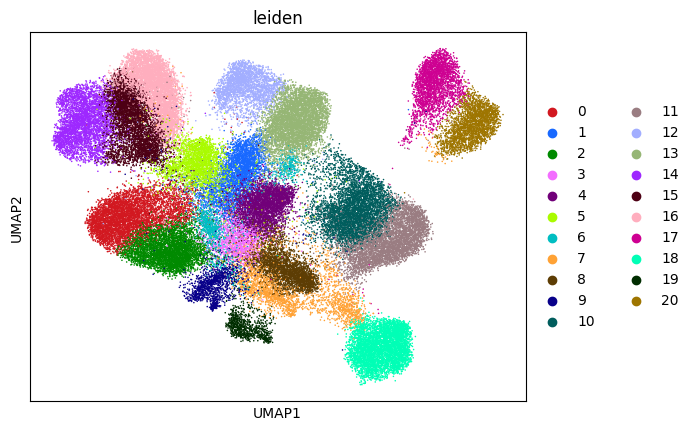

In [48]:
sc.pl.umap(
    adata3,
    color="leiden",
    s=5,
    palette=custPalDict,
)

In [49]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata3, groupby="leiden", method="wilcoxon")

/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/analysis/init-rocker-renv/venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/analysis/init-rocker-renv/venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[g

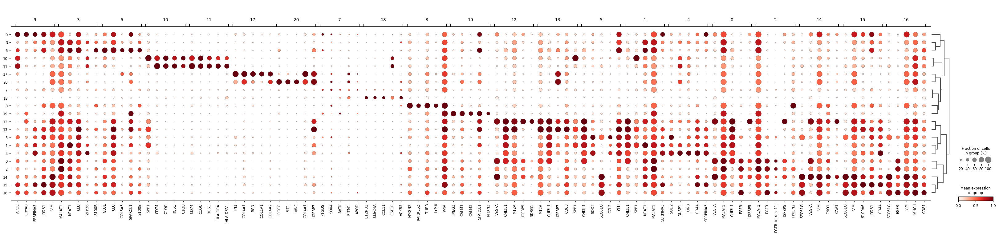

In [50]:
# Plot cluster genes 
sc.pl.rank_genes_groups_dotplot(
    adata3, groupby="leiden", standard_scale="var", n_genes=5
)

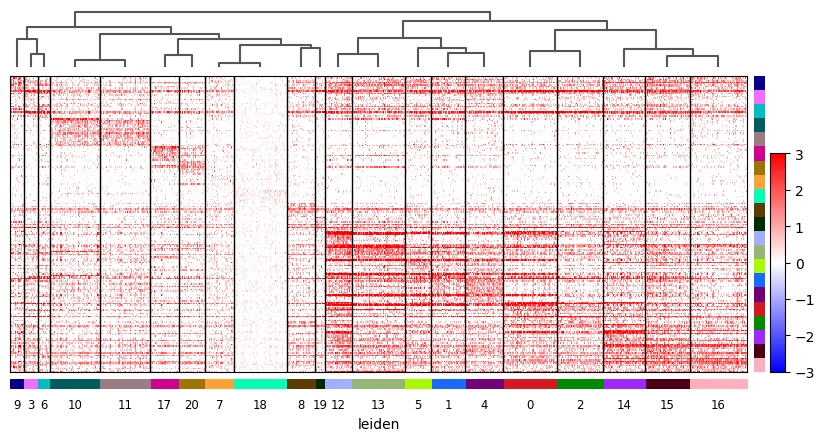

In [51]:
sc.pl.rank_genes_groups_heatmap(
    adata3,
    n_genes=10,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap="bwr",
)

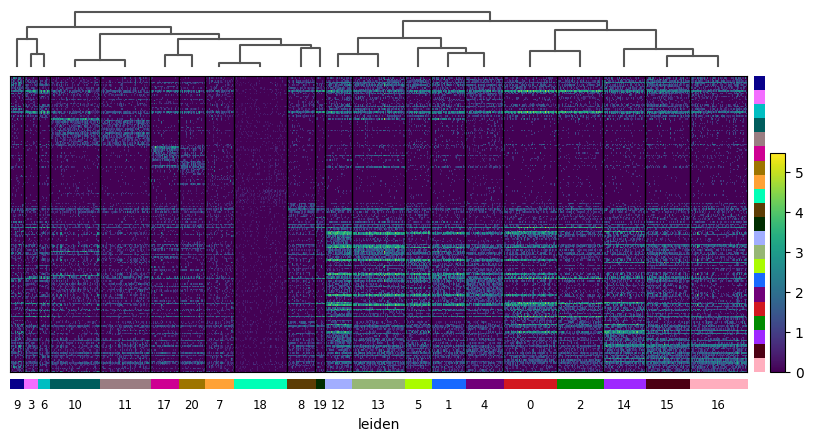

In [52]:
sc.pl.rank_genes_groups_heatmap(
    adata3,
    n_genes=10,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False
)

/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/analysis/init-rocker-renv/venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/analysis/init-rocker-renv/venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[g

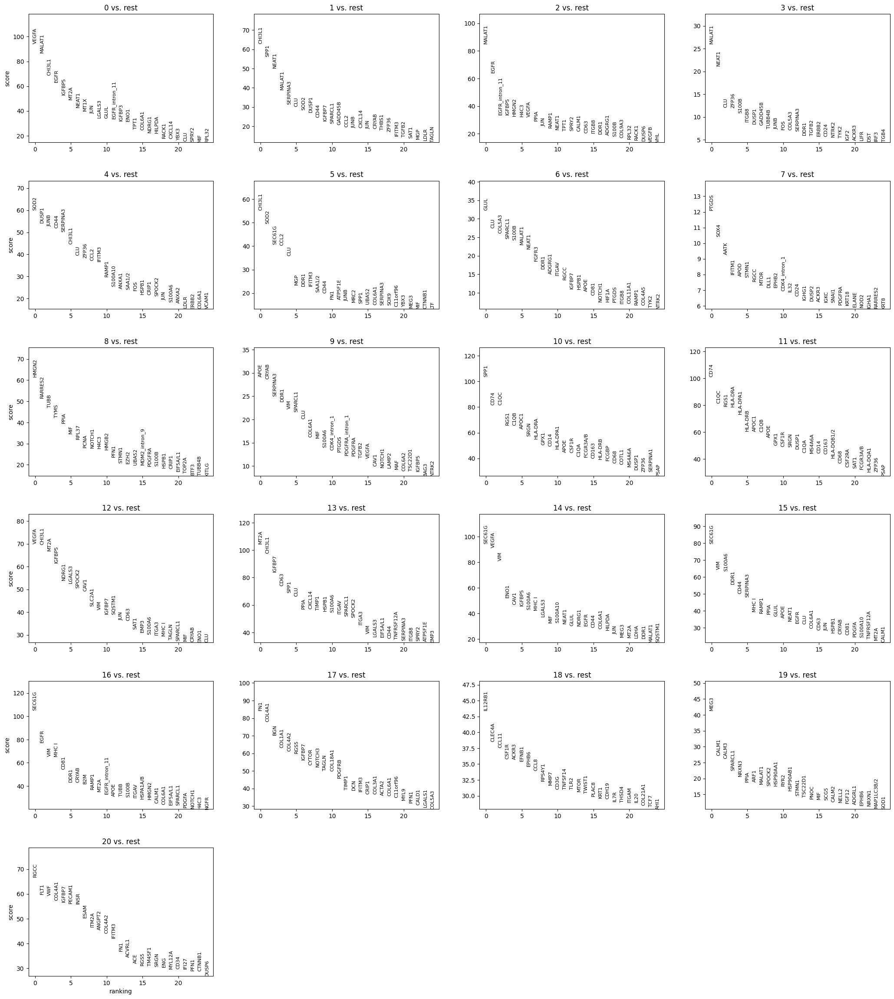

In [59]:
sc.tl.rank_genes_groups(adata3, 'leiden', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata3, n_genes=25, sharey=False, key="wilcoxon")

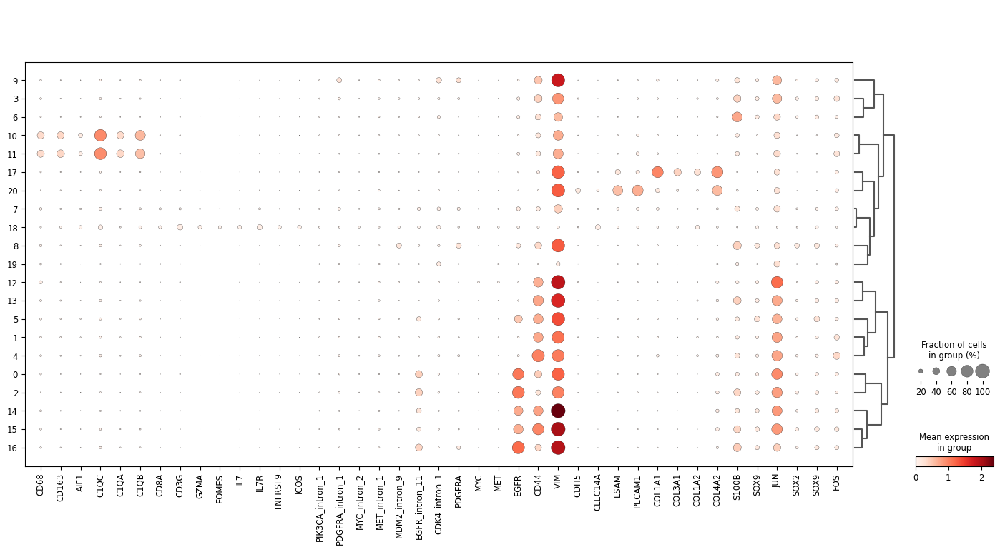

In [53]:
marker_genes_dict = {
    'Macrophage' : ['CD68','CD163','AIF1','C1QC','C1QA','C1QB'],
    'T-Cell' : ['CD8A','CD3G','GZMA','EOMES','IL7','IL7R','TNFRSF9','ICOS'],
    'Tumour' : ['PIK3CA_intron_1','PDGFRA_intron_1','MYC_intron_2','MET_intron_1','MDM2_intron_9','EGFR_intron_11','CDK4_intron_1','PDGFRA','MYC','MET','EGFR','CD44','VIM'],
    'Endo/Fibro' : ['CDH5','CLEC14A','ESAM','PECAM1','COL1A1','COL3A1','COL1A2','COL4A2'],
    'Astrocyte' : ['S100B', 'SOX9'],
    'Neuron' : ['JUN', 'SOX2', 'SOX9','FOS']
}

markers = sum(list(marker_genes_dict.values()), [])

sc.pl.dotplot(adata3, markers, "leiden", dendrogram=True)

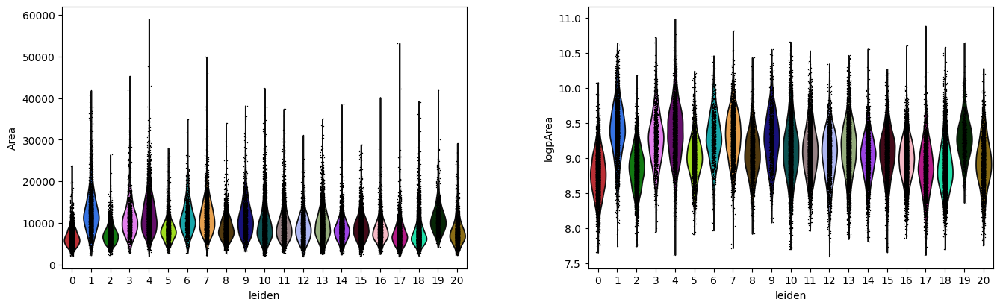

In [54]:
# Plot average area of cells in each cluster
# Larger cells more likely to be hybrids?
sc.pl.violin(adata3, ["Area", "logpArea"], groupby="leiden", hue="leiden", palette=custPalDict, legend=False)

In [56]:
fovs = list(range(5, 22+1))
fovs = [str(i) for i in fovs]
print(fovs)

['5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22']


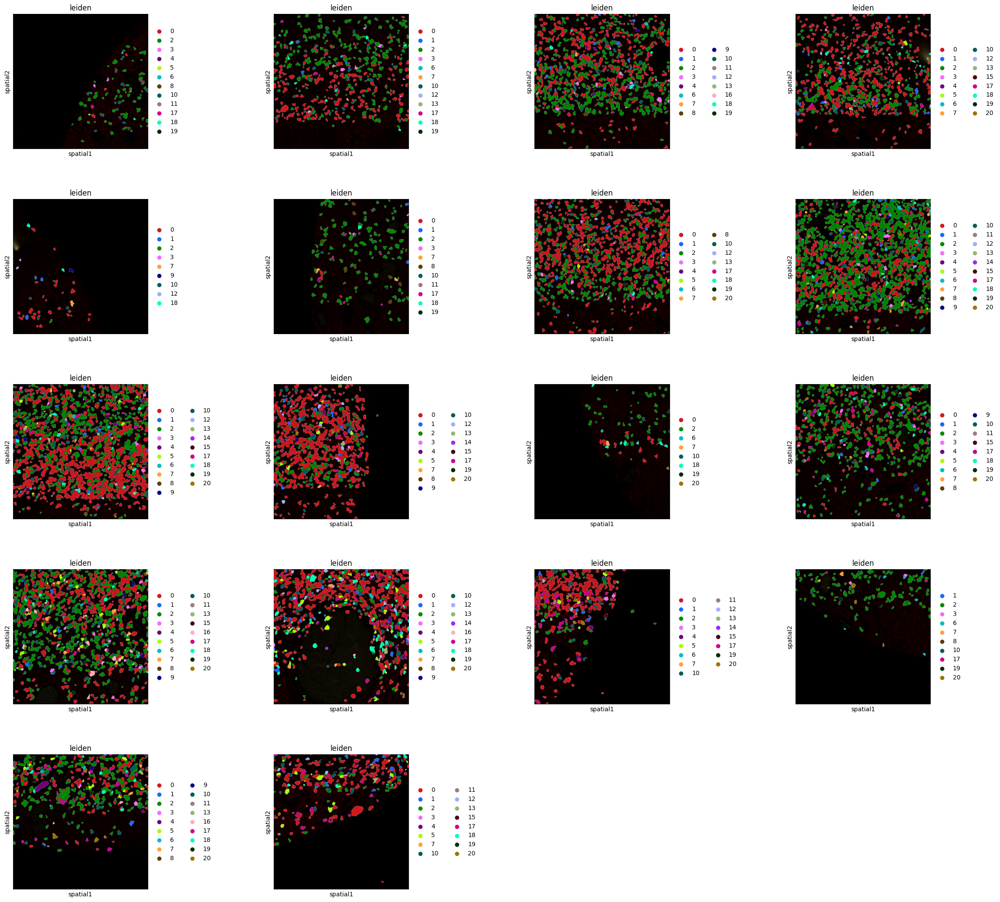

In [60]:
sq.pl.spatial_segment(
    adata3,
    shape="hex",
    color="leiden",
    library_id=fovs,
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True
)

In [103]:
adata3.obs.columns
adata3.obs['total_counts'].sum()

10998253

In [119]:
# Get the FOVs with the top nGenes
fov_nFeatures = adata3.obs.groupby("fov", observed = True)["total_counts"].sum()
fov_nFeatures.sort_values(inplace = True, ascending=False)

topFOVs = list(fov_nFeatures.index[0:11])

print(topFOVs)

# Take a look at these FOVs:

['577', '578', '13', '581', '580', '12', '576', '384', '409', '579', '410']


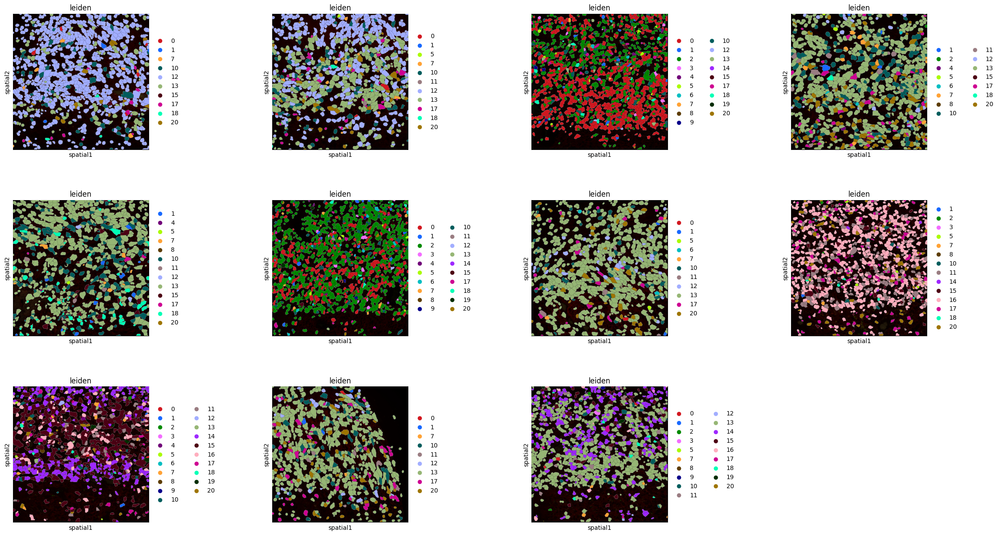

In [120]:
sq.pl.spatial_segment(
    adata3,
    shape="hex",
    color="leiden",
    library_id=topFOVs,
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True
)

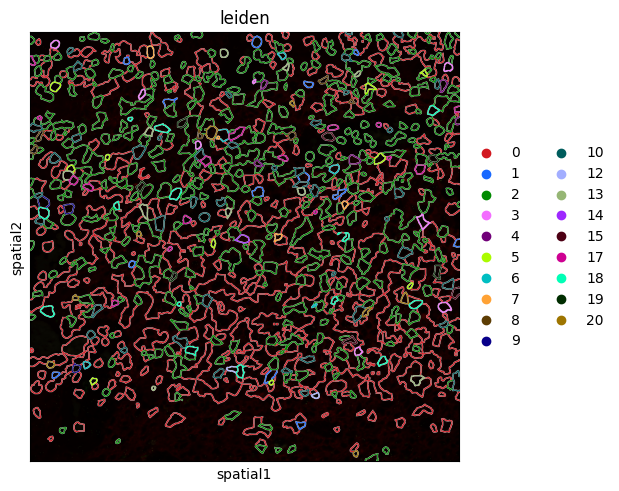

In [121]:
# Lets look at fov 13 in more detail
sq.pl.spatial_segment(
    adata3,
    color="leiden",
    seg_contourpx=20,
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="13",
    img=True
)

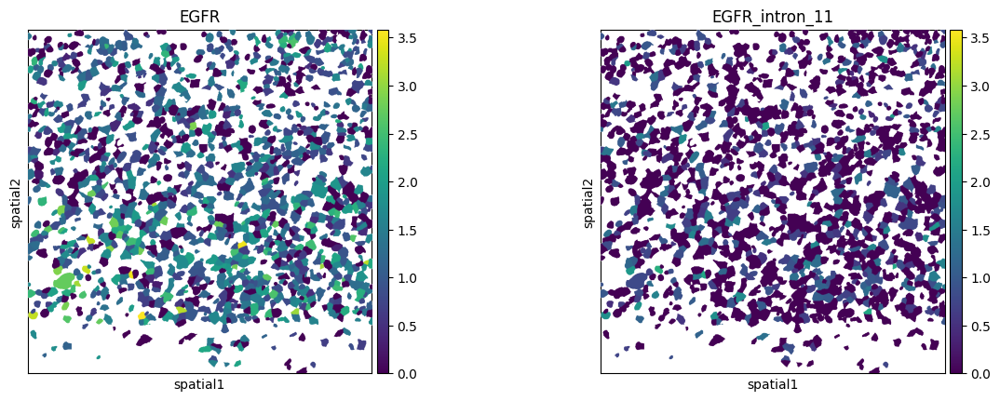

In [122]:
sq.pl.spatial_segment(
    adata3,
    library_id="13",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["EGFR", "EGFR_intron_11"],
    size=60,
    img=False,
)

In [123]:
# Assess gene autocorrelation using Moran's statistic
adata_subset = adata3[adata2.obs.fov == "13"].copy()
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subset.uns["moranI"].head(10)

  0%|          | 0/100 [00:00<?, ?/s]

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
VEGFA,0.620379,0.0,0.000236,0.0,0.009901,0.000479,0.0,0.0,0.062642
CHI3L1,0.399594,0.0,0.000236,0.0,0.009901,0.000284,0.0,0.0,0.062642
MT1X,0.359907,0.0,0.000236,0.0,0.009901,0.000409,0.0,0.0,0.062642
MT2A,0.314500,0.0,0.000236,0.0,0.009901,0.000297,0.0,0.0,0.062642
NDRG1,0.281624,0.0,0.000236,0.0,0.009901,0.000258,0.0,0.0,0.062642
FN1,0.257753,0.0,0.000236,0.0,0.009901,0.000286,0.0,0.0,0.062642
LGALS3,0.205587,0.0,0.000236,0.0,0.009901,0.000275,0.0,0.0,0.062642
GLUL,0.193922,0.0,0.000236,0.0,0.009901,0.000241,0.0,0.0,0.062642
RGS5,0.185421,0.0,0.000236,0.0,0.009901,0.000216,0.0,0.0,0.062642
IGFBP5,0.178765,0.0,0.000236,0.0,0.009901,0.000194,0.0,0.0,0.062642


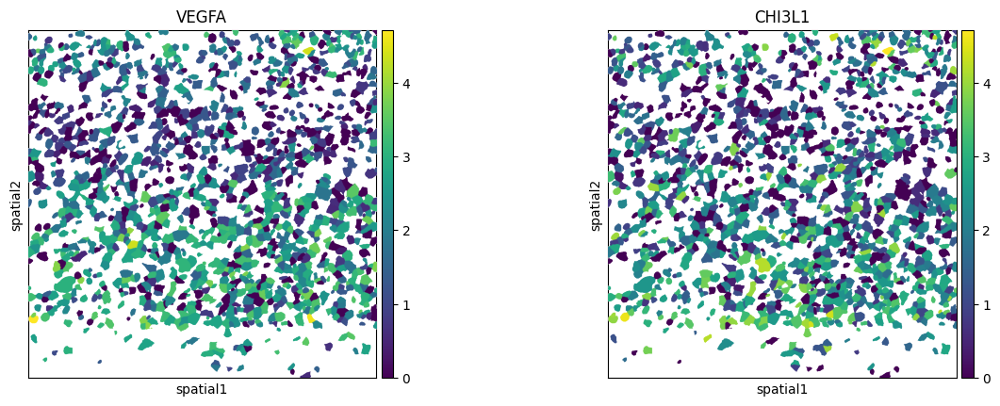

In [128]:
sq.pl.spatial_segment(
    adata_subset,
    library_id="13",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["VEGFA", "CHI3L1"],
    size=60,
    img=False
)

  0%|          | 0/1 [00:00<?, ?/s]

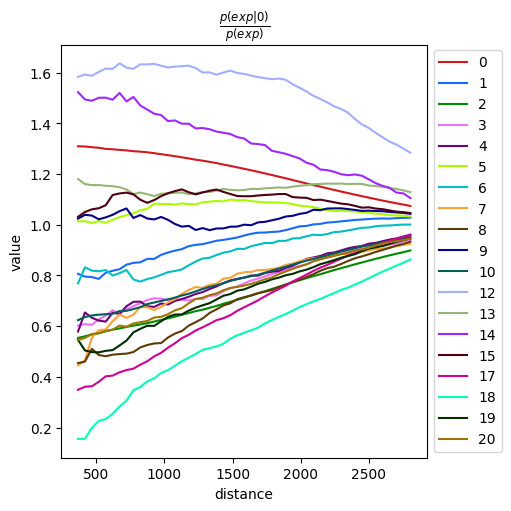

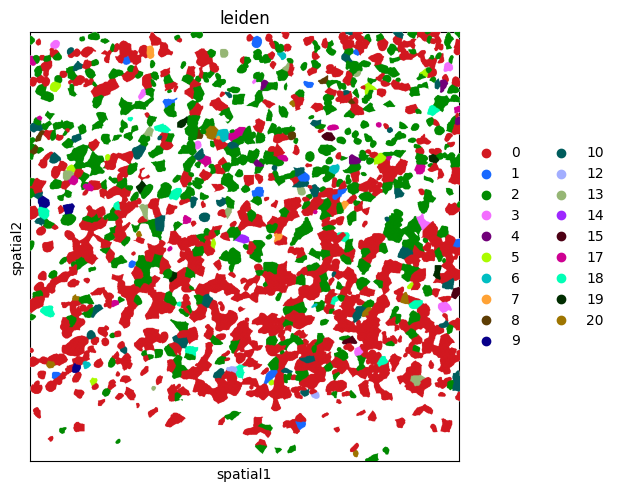

In [129]:
# Plot co-occurence
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden",
)

sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden",
    clusters="0"
)
sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="13",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False
)

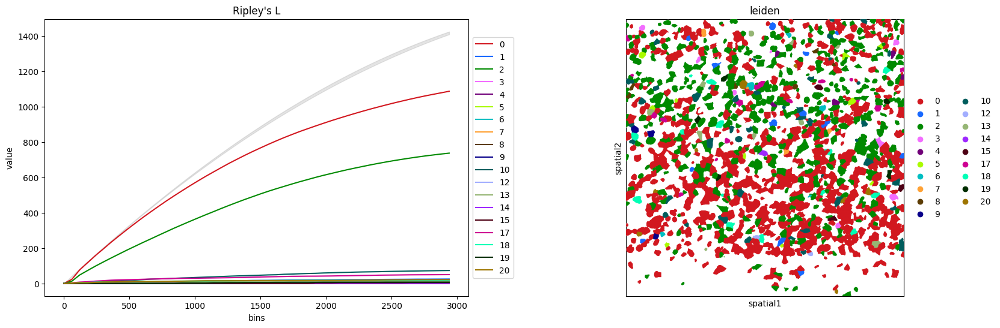

In [130]:
# Ripley's statistic - do clusters have random or distribution
mode = "L"
fig, ax = plt.subplots(1, 2, figsize=(20, 6))

sq.gr.ripley(adata_subset, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_subset,
    cluster_key="leiden",
    mode=mode,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="13",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[1],
)

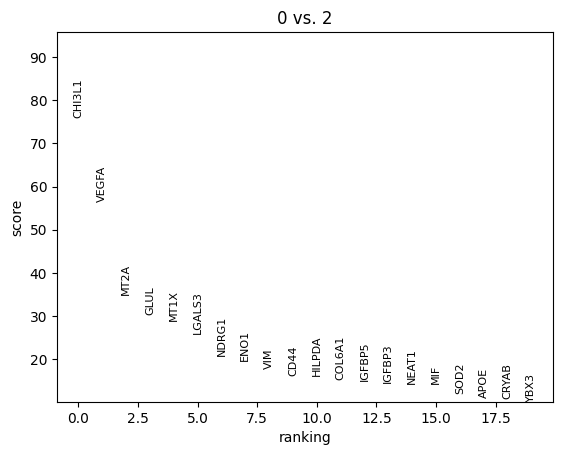

In [131]:
# Lets compare cluster 0 and 2
sc.tl.rank_genes_groups(adata3, 'leiden', groups=['0'], reference='2', method='wilcoxon')
sc.pl.rank_genes_groups(adata3, groups=['0'], n_genes=20)

/nemo/stp/babs/working/bootj/projects/swantonc/imran.noorani/in839/analysis/init-rocker-renv/venv/lib/python3.12/site-packages/scanpy/plotting/_tools/__init__.py:1320: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ax.set_xticklabels(new_gene_names, rotation="vertical")


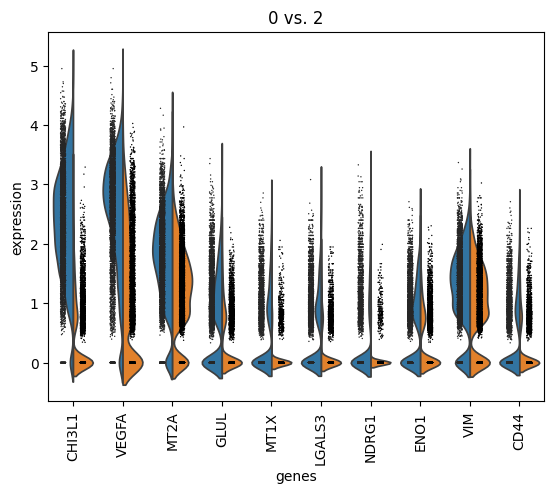

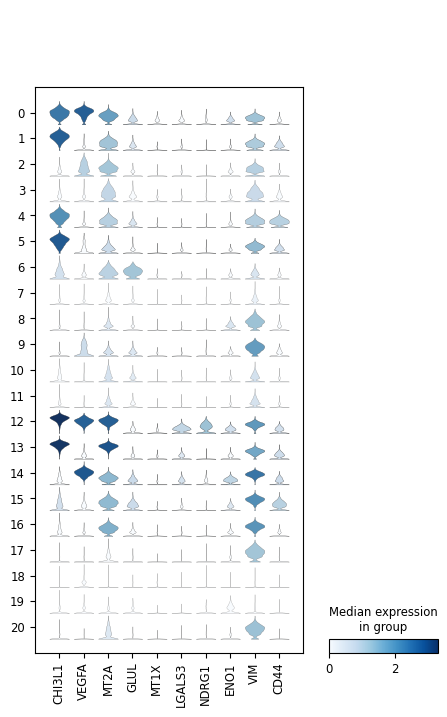

In [133]:
sc.pl.rank_genes_groups_violin(adata3, groups='0', n_genes=10)

# plot the same genes as violins across all the datasets.

# convert numpy.recarray to list
mynames = [x[0] for x in adata3.uns['rank_genes_groups']['names'][:10]]
sc.pl.stacked_violin(adata3, mynames, groupby = 'leiden')

In [ ]:
# Try subsetting down to FOVs which a certain number of transcripts (50k)
fovCounts = pd.DataFrame(adata2.obs.groupby("fov", observed = True).sum()["total_counts"])
fovCountsFilt = fovCounts[fovCounts['total_counts'] > 50000] 

fovsPass = fovCountsFilt.index.to_list()

# Filter anndata obj to these FOVs
adata4 = adata1[adata1.obs.fov.isin(fovsPass)]

In [ ]:
qcPlots(adata=adata4)

In [ ]:
# Filter cells
# Squidpy suggested = 100
# Nanostring suggested = 250

mask, _ = sc.pp.filter_cells(adata4, min_counts=100, inplace=False)
adata5 = adata4[mask].copy()

# View AnnData object dimensions after filtering 
adata5.shape

In [ ]:
# Filter genes
# Squidpy suggested = 400
# Nanostring suggested = 1000

sc.pp.filter_genes(adata5, min_cells=400)

# View AnnData object dimensions after filtering 
adata5.shape

In [ ]:
qcPlots(adata=adata5)